<a href="https://colab.research.google.com/github/PatriwalaAmit/AI_Quantum_Genius/blob/research/Quantum_Genius.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [113]:
pip install librosa

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [114]:
import librosa

## Sample data 1 data/d4e3e8180a65648886ff348c7a6bbff5/audio.m4a

In [115]:
# file /data/d4e3e8180a65648886ff348c7a6bbff5/audio.m4a

audio_data = '/content/drive/MyDrive/Quantum_Genius/data/d4e3e8180a65648886ff348c7a6bbff5/audio.m4a'
x , sr = librosa.load(audio_data)

<ipython-input-115-0b4999f308c4>:4: UserWarning: PySoundFile failed. Trying audioread instead.
  x , sr = librosa.load(audio_data)
/usr/local/lib/python3.10/dist-packages/librosa/core/audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


In [116]:
import IPython.display as ipd
ipd.Audio(audio_data)

In [117]:
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display

### Checking the data

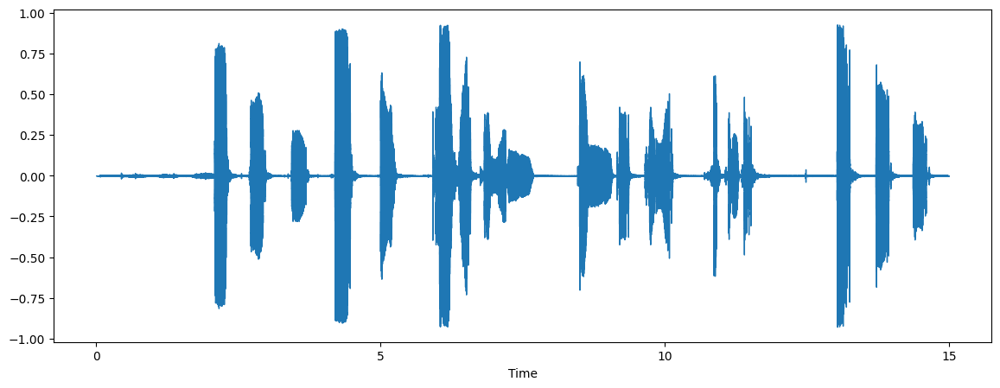

In [118]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x, sr=sr)

In [119]:
pip install pydub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [120]:
from pydub import AudioSegment

### converting file to WAV format

In [121]:
import os
import glob

In [122]:
def CreateDir(audio_folder):
  if not os.path.exists(audio_folder):
    os.makedirs(audio_folder)

In [123]:
my_drive = "/content/drive/MyDrive/Quantum_Genius/sample_data/"

m4a_file = audio_data

wav_file_path = my_drive + "d4e3e8180a65648886ff348c7a6bbff5/"

track = AudioSegment.from_file(m4a_file,  format= 'm4a')

CreateDir(wav_file_path)

file_handle = track.export(wav_file_path+"audio.wav", format='wav')

wav_file_path = "/content/drive/MyDrive/Quantum_Genius/sample_data/d4e3e8180a65648886ff348c7a6bbff5/audio.wav"

In [125]:
ipd.Audio(wav_file_path)

### checking data - wav file

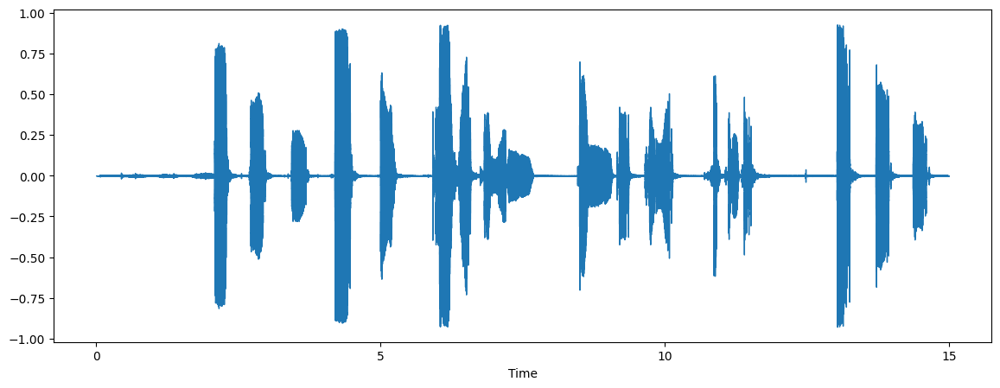

In [126]:
x , sr = librosa.load(wav_file_path)

plt.figure(figsize=(14, 5))
librosa.display.waveshow(x, sr=sr)

### remove noise from the data

In [127]:
import librosa
import numpy as np
from scipy.io import wavfile
from scipy.signal import wiener

In [128]:
audio_path = wav_file_path
sample_rate, audio_data = wavfile.read(audio_path)

#### Convert the audio data to mono if it's stereo:

In [129]:
if len(audio_data.shape) > 1:
    audio_data = np.mean(audio_data, axis=1)

#### Preprocess the audio data:

In [130]:
audio_data = audio_data.astype(float)
audio_data /= 2**15  # Normalize the audio data to the range [-1, 1]

#### Apply a noise reduction algorithm (Wiener filter):

In [132]:
filtered_data = wiener(audio_data)

#### Convert the filtered audio data back to its original format:

In [133]:
filtered_data *= 2**15  # Scale the audio data back to its original range
filtered_data = filtered_data.astype(np.int16)

#### Save the filtered audio to a new file

In [134]:
my_drive = "/content/drive/MyDrive/Quantum_Genius/sample_data/"
output_path = my_drive+"d4e3e8180a65648886ff348c7a6bbff5/clean_audio.wav"
wavfile.write(output_path, sample_rate, filtered_data)

ipd.Audio(output_path)

#### checking the clean audio / process audio

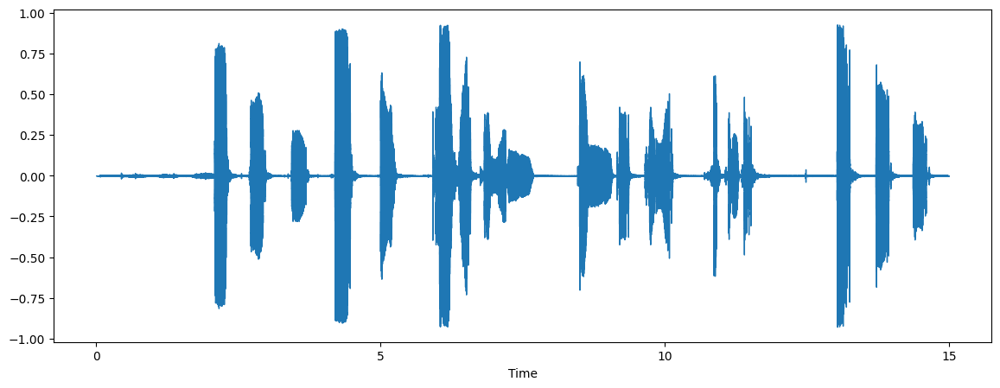

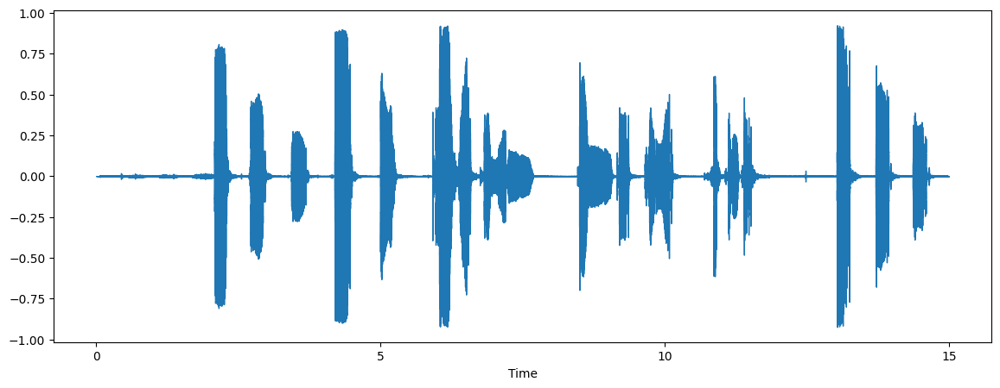

In [135]:
x , sr = librosa.load(wav_file_path)

plt.figure(figsize=(14, 5))
librosa.display.waveshow(x, sr=sr)

x , sr = librosa.load(output_path)

plt.figure(figsize=(14, 5))
librosa.display.waveshow(x, sr=sr)

#### Noise Reduction using the noisereduce library:

ModuleNotFoundError: ignored

#### advanced noise reduction technique called spectral subtraction

In [66]:
import numpy as np
import scipy.io.wavfile as wav
from scipy.signal import spectrogram, istft

##### get the framesize

In [68]:
import wave

In [69]:
audio_path = wav_file_path

with wave.open(audio_path, "rb") as audio_file:
    frame_size = audio_file.getframerate()

print("Frame size:", frame_size)

Frame size: 44100


##### get the hope length

In [72]:
desired_frame_rate = 50  # Desired frame rate in frames per second

# Get the sample rate of the audio file
audio_path = wav_file_path
sample_rate, _ = wav.read(audio_path)

# Calculate the hop length
hop_length = sample_rate // desired_frame_rate

print("Hop length:", hop_length)

Hop length: 882


In [80]:
desired_frame_rate = 50  # Desired frame rate in frames per second

# Get the sample rate of the audio file
audio_path = wav_file_path
sample_rate, _ = wav.read(audio_path)

# Calculate the frame size
frame_duration = 1 / desired_frame_rate
frame_size = int(frame_duration * sample_rate)

# Calculate the overlap (noverlap) based on a desired overlap percentage
overlap_percentage = 0.5  # Desired overlap percentage between frames
noverlap = int(frame_size * overlap_percentage)

# Check if noverlap is greater than or equal to frame_size and adjust if necessary
if noverlap >= frame_size:
    noverlap = frame_size - 1

print("Frame size:", frame_size)
print("Overlap (noverlap):", noverlap)

Frame size: 882
Overlap (noverlap): 441


In [111]:
# Load the audio file
audio_path = wav_file_path
sample_rate, audio_data = wav.read(audio_path)

# Convert the audio data to float and normalize
audio_data = audio_data.astype(float)
audio_data /= np.max(np.abs(audio_data))

# Reshape the audio data to be 1-dimensional
audio_data = audio_data.ravel()

# Define parameters for spectral subtraction
frame_size = 4096  # Size of the analysis frame
hop_length = 1024   # Number of samples between successive frames
n_fft = frame_size  # Number of FFT points (same as frame size for no zero-padding)
n_iterations = 1   # Number of iterations for noise estimation refinement

# Compute the spectrogram of the audio data
_, _, audio_spec = spectrogram(audio_data, fs=sample_rate, window='hann', nperseg=frame_size, noverlap=hop_length, nfft=n_fft)

# Estimate the noise spectrum (average of the first few frames)
noise_spec = np.mean(audio_spec[:, :n_iterations], axis=1)

# Perform spectral subtraction
subtracted_spec = np.maximum(audio_spec - noise_spec[:, np.newaxis], 0.0)

# Inverse STFT to obtain the time-domain signal
_, denoised_signal = istft(subtracted_spec, fs=sample_rate, window='hann', nperseg=frame_size, noverlap=hop_length)

# Scale the denoised signal to match the original audio amplitude
denoised_signal *= np.max(np.abs(audio_data)) / np.max(np.abs(denoised_signal))

# Convert the time-domain signal back to integer format
denoised_signal = denoised_signal.astype(np.int16)

# Save the denoised audio to a new file

my_drive = "/content/drive/MyDrive/Quantum_Genius/sample_data/"
output_path = my_drive+"d4e3e8180a65648886ff348c7a6bbff5/spectrogram_clean_audio.wav"

wav.write(output_path, sample_rate, denoised_signal)

print("file created ", output_path)

file created  /content/drive/MyDrive/Quantum_Genius/sample_data/d4e3e8180a65648886ff348c7a6bbff5/spectrogram_clean_audio.wav


#### check the spectrogram clean audio

In [112]:
my_drive = "/content/drive/MyDrive/Quantum_Genius/sample_data/"
output_path = my_drive+"d4e3e8180a65648886ff348c7a6bbff5/spectrogram_clean_audio.wav"

ipd.Audio(output_path)

In [45]:
pip install SpeechRecognition

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 32.8/32.8 MB 36.9 MB/s eta 0:00:00


# New section

In [ ]:
pip show SpeechRecognition

Name: SpeechRecognition
Version: 3.10.0
Summary: Library for performing speech recognition, with support for several engines and APIs, online and offline.
Home-page: https://github.com/Uberi/speech_recognition#readme
Author: Anthony Zhang (Uberi)
Author-email: azhang9@gmail.com
License: BSD
Location: /usr/local/lib/python3.10/dist-packages
Requires: requests
Required-by: 


In [ ]:
pip install --upgrade SpeechRecognition

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import speech_recognition as sr
import re
from pydub import AudioSegment

In [ ]:
# recognizer = sr.Recognizer()

In [ ]:
ipd.Audio('/content/d4e3e8180a65648886ff348c7a6bbff5.wav')

In [ ]:
def count_vowel_sequences(audio_file):
    recognizer = sr.Recognizer()

    # Load the audio file
    audio = AudioSegment.from_file(audio_file)

    # # Convert audio to WAV format
    # wav_file = "audio.wav"
    # audio.export(wav_file, format="wav")

    #Read the WAV file
    with sr.AudioFile(audio_file) as source:
      audio = recognizer.record(source)

    # # Convert speech to text
    text = recognizer.recognize_google(audio)
    print(text)
    # audio = ''

    # # Find vowel sequences using regular expressions
    #vowel_sequences = re.findall("[AEIOU]+", text, re.IGNORECASE)

    # # Count occurrences of vowel sequences
    counts = {}
    # for sequence in vowel_sequences:
    #     counts[sequence] = counts.get(sequence, 0) + 1

    return counts

In [ ]:
wav_file_path = "/content/d4e3e8180a65648886ff348c7a6bbff5.wav"
print(wav_file_path)
frequency_counts = count_vowel_sequences(wav_file_path)
print(frequency_counts)

/content/d4e3e8180a65648886ff348c7a6bbff5.wav


AttributeError: ignored

# Load the Data

In [ ]:
## This returns an audio time series as a numpy array with a default sampling rate(sr) of 22KHZ mono. We can change this behavior by resampling at 44.1KHz.
x , sr = librosa.load(wav_file_path)
print(type(x), type(sr))

<class 'numpy.ndarray'> <class 'int'>


In [ ]:
# librosa.load(audio_data, sr=44100) or disabled
librosa.load(wav_file_path, sr=None)

(array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 44100)

## Visualizing Audio

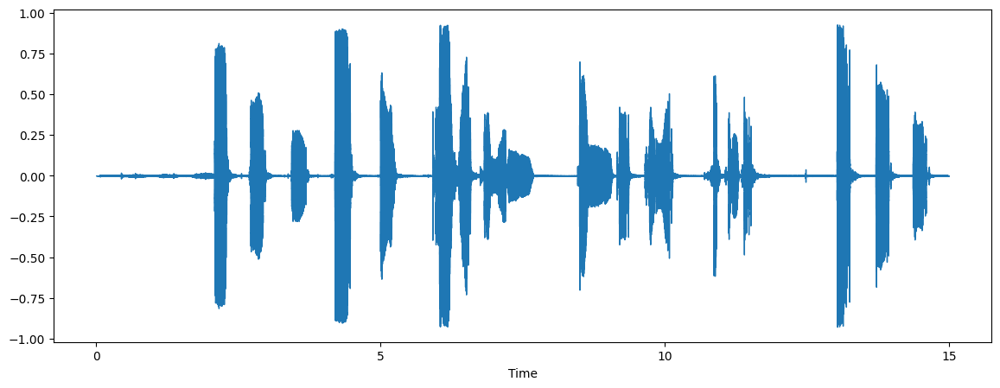

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x, sr=sr)

In [ ]:
librosa.load(wav_file_path, sr=44100)

(array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 44100)

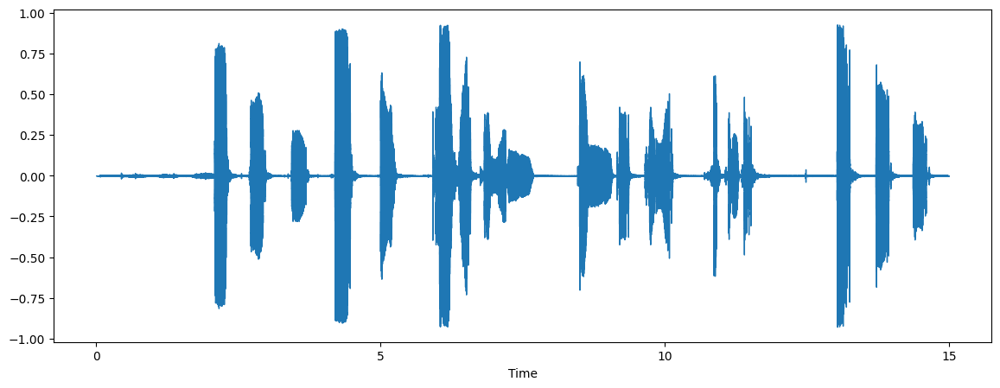

In [ ]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x, sr=sr)

### spectrogram

#### A spectrogram is a visual way of representing the signal strength, or “loudness”, of a signal over time at various frequencies present in a particular waveform. Not only can one see whether there is more or less energy at, for example, 2 Hz vs 10 Hz, but one can also see how energy levels vary over time.

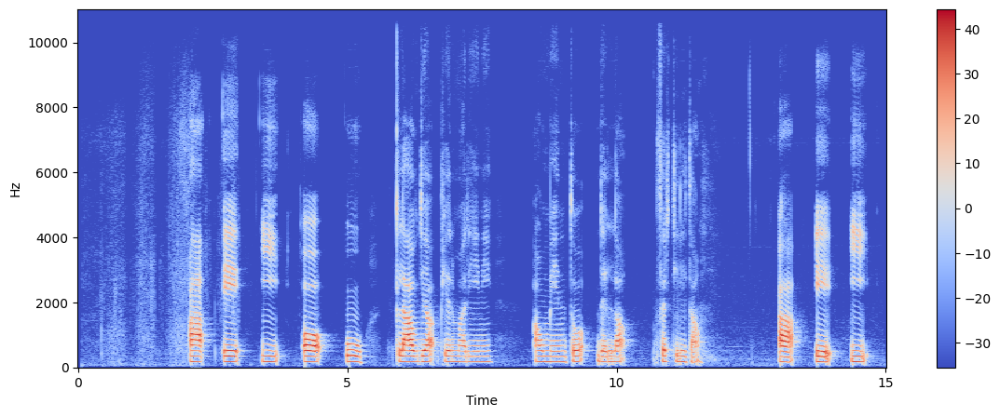

In [ ]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

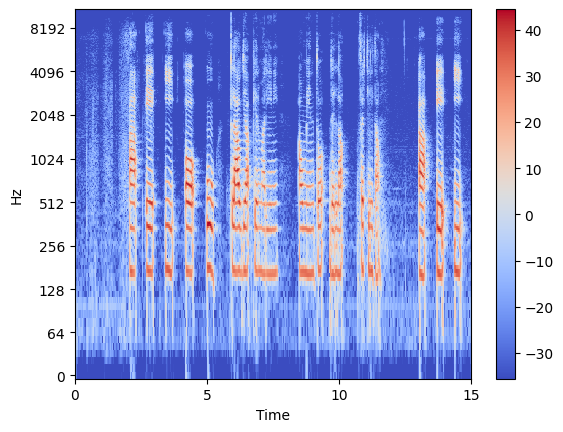

In [ ]:
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

### Spectral Centroid

#### The spectral centroid indicates at which frequency the energy of a spectrum is centered upon or in other words It indicates where the ” center of mass” for a sound is located. This is like a weighted mean:

In [ ]:
import sklearn

In [ ]:
x , sr = librosa.load(wav_file_path)

spectral_centroids = librosa.feature.spectral_centroid(y=x, sr=sr)[0]

spectral_centroids.shape

(647,)

In [ ]:
# Computing the time variable for visualization
plt.figure(figsize=(12, 4))
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

<Figure size 1200x400 with 0 Axes>

In [ ]:
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

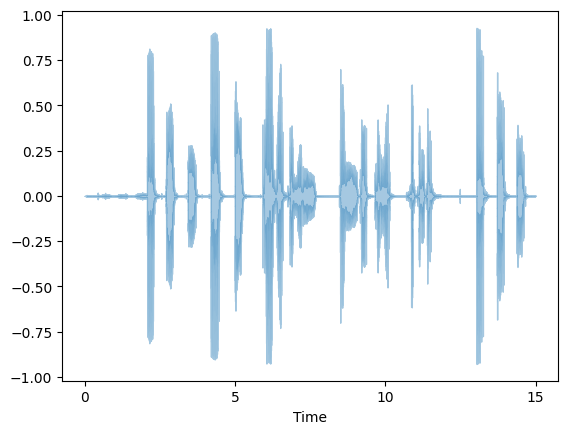

In [ ]:
#Plotting the Spectral Centroid along the waveform
librosa.display.waveshow(x, sr=sr, alpha=0.4)

In [ ]:
from sklearn import preprocessing

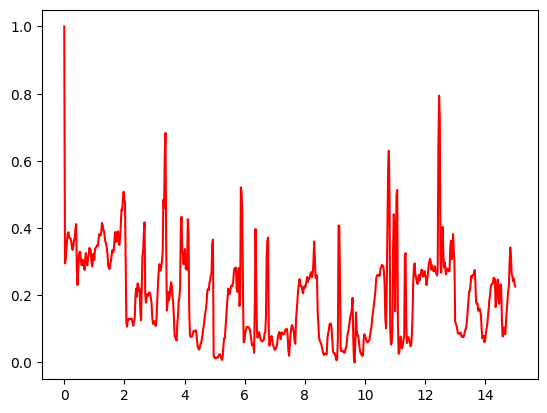

In [ ]:
plt.plot(t, normalize(spectral_centroids), color='red')

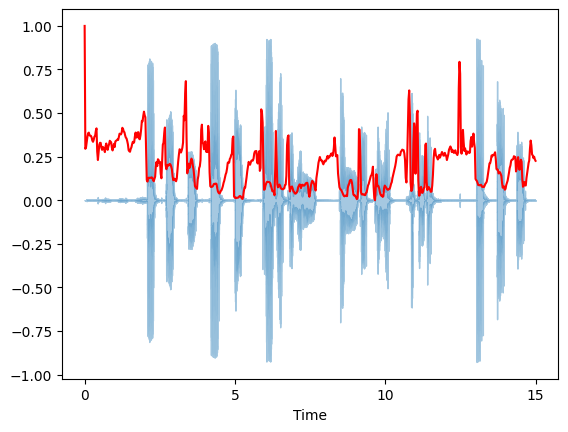

In [ ]:
#Plotting the Spectral Centroid along the waveform
librosa.display.waveshow(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='red')

### Spectral Rolloff

In [ ]:
x , sr = librosa.load(wav_file_path)

spectral_rolloff = librosa.feature.spectral_rolloff(x, sr=sr)[0]

plt.figure(figsize=(12, 4))

librosa.display.waveshow(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')

TypeError: ignored

In [ ]:
from pydub import AudioSegment

In [ ]:
import numpy as np

In [ ]:
import os
import glob

In [ ]:
import speech_recognition as sr
import re
from pydub import AudioSegment

In [ ]:
def split_audio_by_vowels(audio_file,audio_folder):
    if not os.path.exists(audio_folder):
      os.makedirs(audio_folder)

    # Load the audio file
    audio = AudioSegment.from_file(audio_file)

    # Convert audio to WAV format
    wav_file = "audio.wav"
    audio.export(wav_file, format="wav")

    # Initialize the speech recognition recognizer
    recognizer = sr.Recognizer()

    # Read the WAV file
    with sr.AudioFile(wav_file) as source:
        audio_data = recognizer.record(source)

    # Perform speech recognition on the audio
    text = recognizer.recognize_google(audio_data)
    print(text)

    # Find vowel sequences using regular expressions
    vowel_sequences = re.findall("[AEIOU]+", text, re.IGNORECASE)

    print(vowel_sequences)

    # Split the audio into vowel segments
    vowel_segments = []
    start_time = 0
    for vowel in vowel_sequences:
        duration = int(len(vowel) * 1000)  # Convert to milliseconds
        segment = audio[start_time:start_time + duration]
        vowel_segments.append(segment)
        start_time += duration

    # Save each vowel segment as a separate file
    for i, segment in enumerate(vowel_segments):
        output_file = f"{audio_folder}/vowel_{i}.wav"
        segment.export(output_file, format="wav")

In [ ]:
ipd.Audio('/content/audio.wav')

ValueError: ignored

### Sample 1 - d4e3e8180a65648886ff348c7a6bbff5

In [ ]:
audio_data = '/content/drive/MyDrive/Quantum_Genius/data/d4e3e8180a65648886ff348c7a6bbff5/audio.m4a'

split_audio_by_vowels(audio_data,"audio/d4e3e8180a65648886ff348c7a6bbff5")

AttributeError: ignored

In [ ]:
# A
ipd.Audio('/content/audio/d4e3e8180a65648886ff348c7a6bbff5/vowel_2.wav')

In [ ]:
# E
ipd.Audio('/content/audio/d4e3e8180a65648886ff348c7a6bbff5/vowel_3.wav')

In [ ]:
# O U
ipd.Audio('/content/audio/d4e3e8180a65648886ff348c7a6bbff5/vowel_4.wav')

In [ ]:
ipd.Audio('/content/audio/vowel_5.wav')

In [ ]:
ipd.Audio('/content/audio/vowel_6.wav')

In [ ]:
ipd.Audio('/content/audio/vowel_7.wav')

In [ ]:
ipd.Audio('/content/audio/vowel_8.wav')

In [ ]:
ipd.Audio('/content/audio/vowel_9.wav')

In [ ]:
ipd.Audio('/content/audio/vowel_10.wav')

### Sample 2 953bd83cb0b9c9f9dc4b3ba0bfc1b236

In [ ]:
ipd.Audio('/content/audio.wav')

ValueError: ignored

In [ ]:
audio_data = '/content/drive/MyDrive/Quantum_Genius/data/953bd83cb0b9c9f9dc4b3ba0bfc1b236/audio.m4a'

split_audio_by_vowels(audio_data,"audio/953bd83cb0b9c9f9dc4b3ba0bfc1b236")

In [ ]:
# A E I O U
ipd.Audio('/content/audio/953bd83cb0b9c9f9dc4b3ba0bfc1b236/vowel_0.wav')

In [ ]:
# I O U
ipd.Audio('/content/audio/953bd83cb0b9c9f9dc4b3ba0bfc1b236/vowel_2.wav')

In [ ]:
import os
import glob

In [ ]:
files = glob.glob('/content/*.wav')
for f in files:
    os.remove(f)

### Sample 3 279dc09a13b9dc662c574a804d650d95

In [ ]:
audio_data = '/content/drive/MyDrive/Quantum_Genius/data/279dc09a13b9dc662c574a804d650d95/audio.m4a'

split_audio_by_vowels(audio_data,"audio/279dc09a13b9dc662c574a804d650d95")

In [ ]:
ipd.Audio('/content/audio.wav')

In [ ]:
# A
ipd.Audio('/content/audio/279dc09a13b9dc662c574a804d650d95/vowel_1.wav')

In [ ]:
# E
ipd.Audio('/content/audio/279dc09a13b9dc662c574a804d650d95/vowel_2.wav')

In [ ]:
# I O
ipd.Audio('/content/audio/279dc09a13b9dc662c574a804d650d95/vowel_3.wav')

In [ ]:
# U
ipd.Audio('/content/audio/279dc09a13b9dc662c574a804d650d95/vowel_4.wav')

ValueError: ignored

## Get the energy

In [ ]:
import numpy as np

In [ ]:
def plot_energy_graph(audio_file):
    # Load the audio file
    audio, sr = librosa.load(audio_file, sr=None)

    # Compute the Short-Time Fourier Transform (STFT)
    stft = librosa.stft(audio)

    # Calculate the magnitude spectrogram
    magnitude_spectrogram = np.abs(stft)

    # Compute the frame-wise energy
    energy = np.sum(magnitude_spectrogram, axis=0)

    # Create the time axis for the energy graph
    duration = len(audio) / sr
    time_axis = np.linspace(0, duration, len(energy))

    # Plot the energy graph
    plt.figure(figsize=(10, 4))
    plt.plot(time_axis, energy)
    plt.xlabel('Time (s)')
    plt.ylabel('Energy')
    plt.title('Energy Graph')
    plt.show()

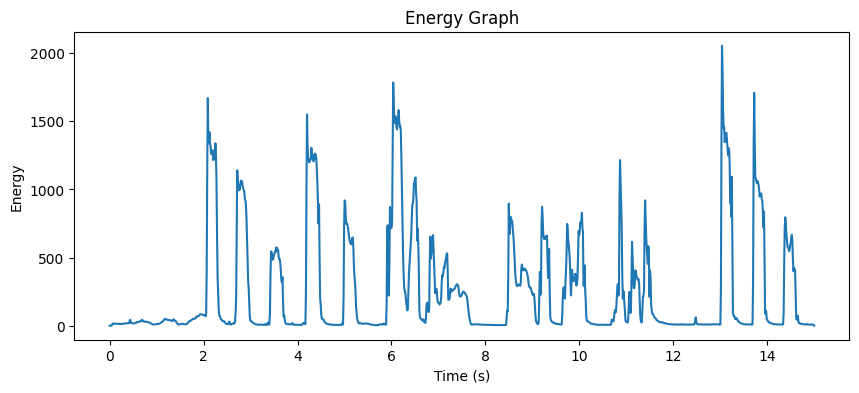

In [ ]:
plot_energy_graph("/content/d4e3e8180a65648886ff348c7a6bbff5.wav")

In [ ]:
def calculate_energy(audio_file):
    # Load the audio file
    audio, sample_rate = librosa.load(audio_file)

    # Calculate the squared values of the audio samples
    squared_samples = np.square(audio)

    # Compute the energy by summing the squared samples
    energy = np.sum(squared_samples)

    # Normalize the energy by dividing it by the number of samples
    normalized_energy = energy / len(audio)

    return normalized_energy

In [ ]:
# Parameters
duration = 15  # Recording duration in seconds
sample_rate = 44100  # Sample rate in Hz

# Calculate the energy of the recorded audio
energy = calculate_energy("/content/d4e3e8180a65648886ff348c7a6bbff5.wav")

print("Energy:", energy)

Energy: 0.010859685047492153


### check the values in file

In [ ]:
def calculate_energy_data(audio):
    squared_samples = np.square(audio)
    energy = np.sum(squared_samples)
    return energy

In [ ]:
# Load the audio file
audio_path = "path_to_audio_file.wav"
audio, sr = librosa.load("/content/d4e3e8180a65648886ff348c7a6bbff5.wav", sr=None, mono=True)

# Calculate the energy of the audio
energy = calculate_energy_data(audio)

print(energy)

# Calculate the statistical properties of the energy values
energy_mean = np.mean(energy)

print("Mean ", energy_mean)

energy_std = np.std(energy)

print("Std ", energy_std)

# Estimate the threshold as a certain number of standard deviations from the mean
threshold_factor = 2  # Adjust this factor to control the sensitivity of the threshold
threshold = energy_mean + (threshold_factor * energy_std)

print("Estimated Threshold:", threshold)

7183.854
Mean  7183.854
Std  0.0
Estimated Threshold: 7183.85400390625
